In [1]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
from pylab import *
from pyntcloud import PyntCloud
from matplotlib.pyplot import figure


INFO - 2021-12-17 01:29:30,698 - utils - NumExpr defaulting to 8 threads.


# Visualize Point Cloud

reads a point cloud model of Venice and visualizes it

In [2]:
print("Load a ply point cloud")
venice = o3d.io.read_point_cloud('/Users/liyuxiao/Downloads/Venice/venice_reproduced.ply')

Load a ply point cloud


In [3]:
print("Print (and visualize) the ply point cloud")
print(venice)
print(np.asarray(venice.points))
#o3d.visualization.draw_geometries([venice])

Print the ply point cloud
PointCloud with 155703363 points.
[[ -4.85206032   5.89557219 -20.56928444]
 [ -4.90082502   5.89161825 -20.56928444]
 [ -4.78484344   5.90743399 -20.62068558]
 ...
 [  2.560215   -20.63388824  46.35734177]
 [  2.52462983 -20.60884666  46.40478897]
 [  2.54308152 -20.56798935  46.29407883]]


# Voxel downsampling
Voxel downsampling uses a regular voxel grid to create a uniformly downsampled point cloud from an input point cloud. It is often used as a pre-processing step for many point cloud processing tasks. The algorithm operates in two steps:
1. Points are bucketed into voxels.
2. Each occupied voxel generates exactly one point by averaging all points inside.

In [4]:
print("Downsample the point cloud with a voxel of 0.04")
venice_down = venice.voxel_down_sample(voxel_size = 0.04)

Downsample the point cloud with a voxel of 0.04


After we downsampled the PointCloud, it should be much easier to visualize the PointCloud

In [4]:
o3d.visualization.draw_geometries([venice_down])

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


# Plane segmentation
Open3D also supports segmententation of geometric primitives from point clouds using RANSAC. To find the plane with the largest support in the point cloud, we can use segment_plane. The method has three arguments: distance_threshold defines the maximum distance a point can have to an estimated plane to be considered an inlier, ransac_n defines the number of points that are randomly sampled to estimate a plane, and num_iterations defines how often a random plane is sampled and verified. The function then returns the plane as (𝑎,𝑏,𝑐,𝑑) such that for each point (𝑥,𝑦,𝑧) on the plane we have 𝑎𝑥+𝑏𝑦+𝑐𝑧+𝑑=0. The function further returns a list of indices of the inlier points.

In [16]:
plane_model, inliers = venice_down.segment_plane(distance_threshold=0.01,
                                         ransac_n=3,
                                         num_iterations=1000)
[a, b, c, d] = plane_model
print(f"Plane equation: {a}x + {b}y + {c}z + {d} = 0")

Plane equation: -6.235200517013978e-05x + 0.0007889764487940829y + 0.9999996868141463z + 0.22866236759105774 = 0


Visualize the plane

In [6]:
inlier_cloud = venice_down.select_by_index(inliers)
inlier_cloud.paint_uniform_color([1.0, 0, 0])
outlier_cloud = venice_down.select_by_index(inliers, invert=True)
o3d.visualization.draw_geometries([inlier_cloud, outlier_cloud])

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


# Point cloud outlier removal
statistical_outlier_removal removes points that are further away from their neighbors compared to the average for the point cloud. It takes two input parameters:

1. nb_neighbors, which specifies how many neighbors are taken into account in order to calculate the average distance for a given point.

2. std_ratio, which allows setting the threshold level based on the standard deviation of the average distances across the point cloud. The lower this number the more aggressive the filter will be.



In [121]:
print("Statistical oulier removal")
venice_down, ind = venice_down.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
print("Radius oulier removal")
cl, ind = venice_down.remove_radius_outlier(nb_points=16, radius=0.05)

Statistical oulier removal
Radius oulier removaltliers: [=>                                      ] 2%
Remove statistical outliers: [========================================] 100%
Remove radius outliers: [========================================] 100%


Get the coordinates of the points and the total number of points

In [7]:
venice_coordinate = np.asarray(venice_down.points)
print('coordinates of points:')
print(venice_coordinate)
print('total number of points:')
len(venice_coordinate)

coordinates of points:
[[  0.76118314 -20.92252541  47.1059494 ]
 [  0.63333982 -20.92252541  47.08749771]
 [  0.63729376 -20.90539169  47.05981827]
 ...
 [ 30.0746727   -3.96003485   5.44277859]
 [ -5.58549881   0.5007506   -6.63570881]
 [-10.13751984  -3.01791453   1.95749509]]
total number of points:


4093530

# Point cloud Redress

Please note that here we need to do an iteration so that we could get a more precise model

1. We first rotate the PointCloud so that the plane in the PointCloud is XoY plane
2. Then we scale the PointCloud so that the height in the model would match the height in real world
3. In the end, we translate the PointCloud so that the plane equation could be Z=0

In [26]:
for i in range(1000):

    cos = c
    sin = np.sqrt(a**2+b**2)
    u1= b
    u2= -a

    R = [[cos+u1**2*(1-cos), u1*u2*(1-cos), u2*sin],
    [u1*u2*(1-cos),cos+u2**2*(1-cos),-u1*sin],
    [-u2*sin, u1*sin, cos]]
    
    venice_down.rotate(R, center=venice_down.get_center())

    venice_coordinate = np.asarray(venice_down.points)
    distance = np.zeros((len(venice_coordinate),1))
    for i in range(len(venice_coordinate)):
        distance[i] = abs(venice_coordinate[i,0]*a+ venice_coordinate[i,1]*b+ venice_coordinate[i,2]*c +d)/np.sqrt(a**2+b**2+c**2)

    venice_down.scale(98.6/distance[np.argmax(distance, axis=0)][0,0], center=venice_down.get_center())

    plane_model, inliers = venice_down.segment_plane(distance_threshold=0.01,
                                         ransac_n=3,
                                         num_iterations=1000)
    [a, b, c, d] = plane_model
    venice_down = venice_down.translate((0, 0, d))
    
    print(f"Plane equation: {a}x + {b}y + {c}z + {d} = 0")

Plane equation: -4.879980055856877e-05x + 0.0007101403619742605y + 0.9999997466595908z + -0.2051504953540066 = 0


# Verification

In [27]:
venice_coordinate = np.asarray(venice_down.points)
distance = np.zeros((len(venice_coordinate),1))
for i in range(len(venice_coordinate)):
    distance[i] = abs(venice_coordinate[i,0]*a+ venice_coordinate[i,1]*b+ venice_coordinate[i,2]*c +d)/np.sqrt(a**2+b**2+c**2)

Z coordinate of the height point in Venice: (reference:98.6m)

In [28]:
venice_coordinate[np.argmax(distance, axis=0)][0,2]

98.48128048053749

Distance from the height ppoint to the ground: (reference:98.6m)

In [29]:
distance[np.argmax(distance, axis=0)][0,0]

98.01805444796744

In [30]:
o3d.visualization.draw_geometries([venice_down])

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


2021-12-16 23:43:46.442 python[6208:231437] TSM AdjustCapsLockLEDForKeyTransitionHandling - _ISSetPhysicalKeyboardCapsLockLED Inhibit


# Dada! Right now we finished the model construction part, we could save the model here.

In [31]:
o3d.io.write_point_cloud("/Users/liyuxiao/Downloads/Venice/venice_temp.ply", venice_down)

True

# City Elevation Map Construction
## Map1

In [53]:
distance = np.zeros((len(venice_coordinate),1))
for i in range(len(venice_coordinate)):
    distance[i] = abs(venice_coordinate[i,0]*a+ venice_coordinate[i,1]*b+ venice_coordinate[i,2]*c +d)/np.sqrt(a**2+b**2+c**2)
distance = distance/np.max(np.max(distance))
distance = np.hstack((distance,distance,distance))
venice_down.colors = o3d.utility.Vector3dVector(distance)
o3d.visualization.draw_geometries([venice_down])

[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display


In [54]:
o3d.io.write_point_cloud("/Users/liyuxiao/Downloads/Venice/venice_height.ply", venice_down)

True

## Map2

We load the model from our newly constructed PointCLoud

In [3]:
cloud = PyntCloud.from_file("/Users/liyuxiao/Downloads/Venice/venice_reproduced.ply")

Describe the data

In [4]:
cloud.points.describe()

,x,y,z,nx,ny,nz,red,green,blue
count,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06,4.093530e+06
mean,6.686604e+00,-5.346277e+00,6.616662e+00,-8.815960e-03,-6.040324e-03,6.500330e-01,1.088055e+02,1.073867e+02,9.607085e+01
std,8.941692e+02,1.177987e+03,7.039161e+00,3.230940e-01,3.201820e-01,3.439456e-01,5.019801e+01,3.726008e+01,3.723417e+01
min,-2.077989e+03,-2.827191e+03,-2.360736e+01,-9.027069e-01,-9.276316e-01,-9.228545e-01,0.000000e+00,0.000000e+00,0.000000e+00
25%,-6.878615e+02,-8.370256e+02,4.482318e-01,-1.471397e-01,-1.383019e-01,4.870882e-01,6.700000e+01,8.900000e+01,7.500000e+01
50%,-3.603732e+01,8.539259e+01,5.274564e+00,-2.297957e-03,3.311503e-04,8.170033e-01,9.300000e+01,1.020000e+02,8.800000e+01
75%,7.031517e+02,8.852336e+02,1.208968e+01,1.323771e-01,1.176808e-01,9.057527e-01,1.530000e+02,1.250000e+02,1.150000e+02
max,1.920850e+03,2.432169e+03,9.848128e+01,9.026994e-01,9.276414e-01,9.276541e-01,2.550000e+02,2.550000e+02,2.550000e+02


Transform the points to DataFrame

In [5]:
pointframe = cloud.points
pointframe

,x,y,z,nx,ny,nz,red,green,blue
0,-321.571118,-2481.064918,1.641163,-0.021873,0.029405,0.926921,83,103,84
1,-328.938886,-2480.087819,1.294777,0.114286,-0.044874,0.919103,86,105,86
2,-328.718691,-2478.190471,1.629625,-0.079047,-0.045967,0.922950,89,106,88
3,-321.423756,-2472.796772,1.749646,-0.078822,0.008031,0.923806,86,104,85
4,-323.126059,-2473.963259,1.594163,-0.029256,0.075618,0.924085,86,104,86
...,...,...,...,...,...,...,...,...,...
4093525,-55.568707,-533.325875,13.415871,-0.340523,-0.305138,0.666602,168,125,119
4093526,-72.610017,831.839924,11.699729,0.130820,-0.245771,0.825985,149,110,98
4093527,1352.185379,188.591577,9.998548,0.224651,0.217020,0.865777,158,111,95
4093528,-704.763137,939.715193,7.023732,0.468294,0.398771,0.006097,83,82,76


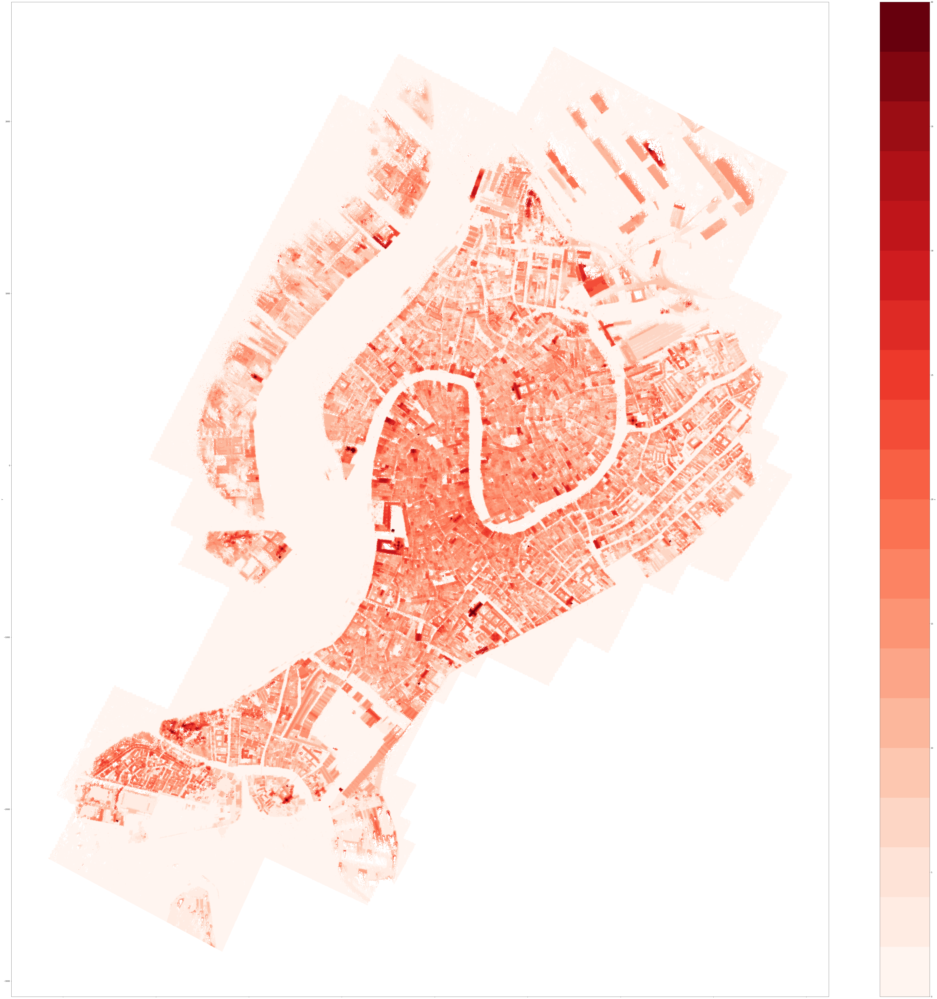

In [7]:
cmap = cm.get_cmap('Reds',20)    # 20 discrete colors
pointframe.plot.scatter(x="x", y="y", c="z", s=5, cmap=cmap, vmin=0, vmax=40, figsize=(100,100))
#plt.savefig('height_2.png')
plt.show()


The function pick_points(pcd) makes an instance of VisualizerWithEditing. To mimic draw_geometries, it creates windows, adds the geometry, visualizes the geometry, and then terminates. A novel interface function from VisualizerWithEditing is get_picked_points() that returns the indices of user-picked vertices.

To pick a vertex, press shift + left click on a window. If a vertex is selected, the visualizer window overlays a sphere on a selected vertex. For example, after picking three vertices in the source point cloud, it shows:

In [57]:
def pick_points(venice):
    print("")
    print(
        "1) Please pick at least three correspondences using [shift + left click]"
    )
    print("   Press [shift + right click] to undo point picking")
    print("2) Afther picking points, press q for close the window")
    vis = o3d.visualization.VisualizerWithEditing()
    vis.create_window()
    vis.add_geometry(venice)
    vis.run()  # user picks points
    vis.destroy_window()
    print("")
    return vis.get_picked_points()

In [58]:
pick_points(venice_down)


1) Please pick at least three correspondences using [shift + left click]
   Press [shift + right click] to undo point picking
2) Afther picking points, press q for close the window
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D WARNING] GLFW Error: Cocoa: Failed to find service port for display
[Open3D INFO] Picked point #727006 (-1.5e+02, -3.2e+02, 19.) to add in queue.



[727006]